# FLEX scRNA pilot
## UMAPS and QC
- Author: Jacopo Umberto Verga
- Date: 27/May/2024



In [2]:
import os
import anndata as ad
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [3]:
adata = sc.read('../out/single_cell_object/adata_clean.h5ad')
adata.obs['scDblFinder_class'] = adata.obs['scDblFinder_class'].astype(str)

In [4]:
adata

AnnData object with n_obs × n_vars = 51609 × 18129
    obs: 'og_barcodes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'total_counts_ig', 'log1p_total_counts_ig', 'pct_counts_ig', 'Scrublet_score', 'Scrublet_doublet', 'SCDS_cxds_score', 'SCDS_bcds_score', 'SCDS_hybrid_score', 'scDblFinder_score', 'scDblFinder_class', 'sample_id', 'thr', 'retrieve_mt', 'leiden'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Scrublet_doublet_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'sample_id_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    

In [4]:
adata_full = sc.read('../out/single_cell_object/adata_full.h5ad')
print(f"Number of cells before filtering: {adata_full.shape[0]}\nNumber of cells after filtering: {adata.shape[0]}\nRatio recovered cells: {adata.shape[0]/adata_full.shape[0]}")
del adata_full

Number of cells before filtering: 54209
Number of cells after filtering: 52759
Ratio recovered cells: 0.9732516740762605


## Overview 

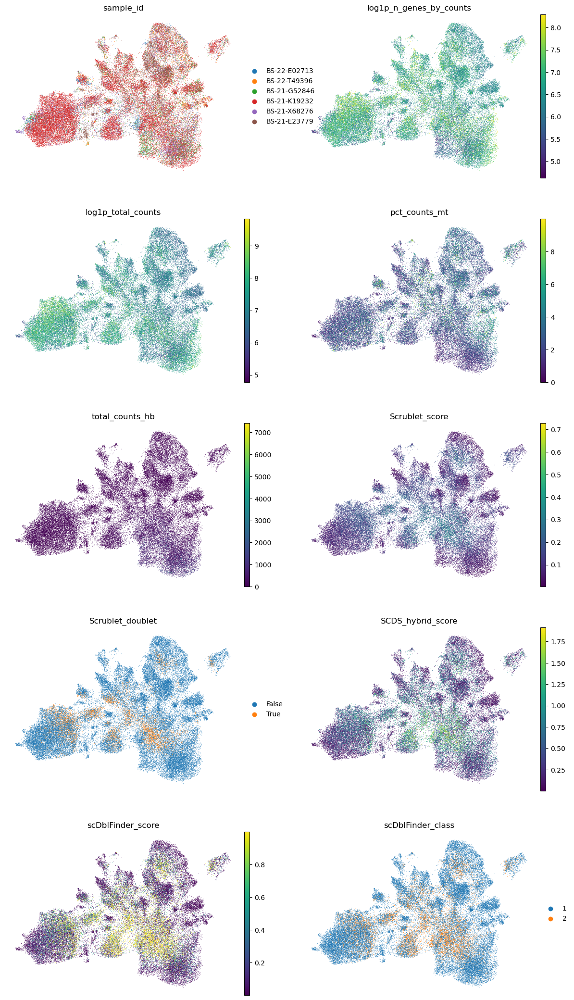

In [15]:
sc.pl.umap(
    adata,
    color=['sample_id',
           'log1p_n_genes_by_counts','log1p_total_counts',
           'pct_counts_mt','total_counts_hb',
           'Scrublet_score','Scrublet_doublet',
           'SCDS_hybrid_score',
           'scDblFinder_score', 'scDblFinder_class'],
    # Setting a smaller point size to get prevent overlap
    size=2,
    ncols=2, frameon=False
)

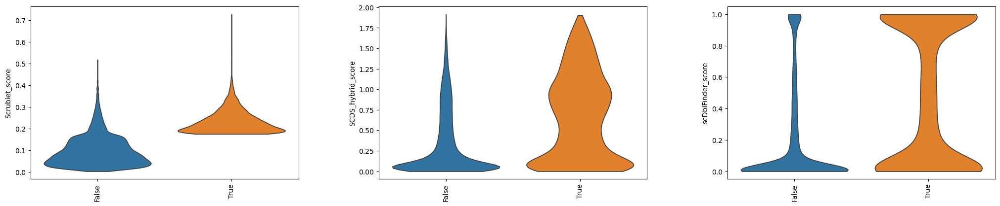

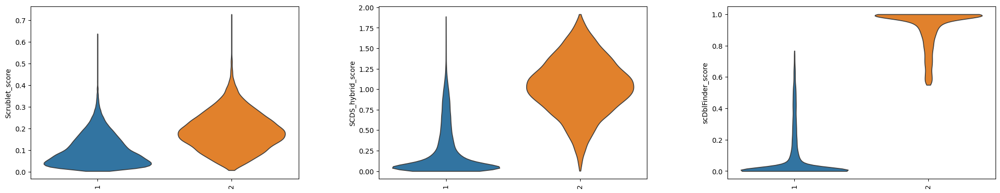

In [14]:
sc.pl.violin(
    adata,
    ['Scrublet_score','SCDS_hybrid_score','scDblFinder_score'],
    'Scrublet_doublet',
    multi_panel=False,stripplot=False,rotation=90
)
sc.pl.violin(
    adata,
    ['Scrublet_score','SCDS_hybrid_score','scDblFinder_score'],
    'scDblFinder_class',
    multi_panel=False,stripplot=False,rotation=90
)

In [11]:
pd.crosstab(adata.obs.Scrublet_doublet, adata.obs.scDblFinder_class)

scDblFinder_class,1,2
Scrublet_doublet,,
False,39682,5779
True,3352,2796


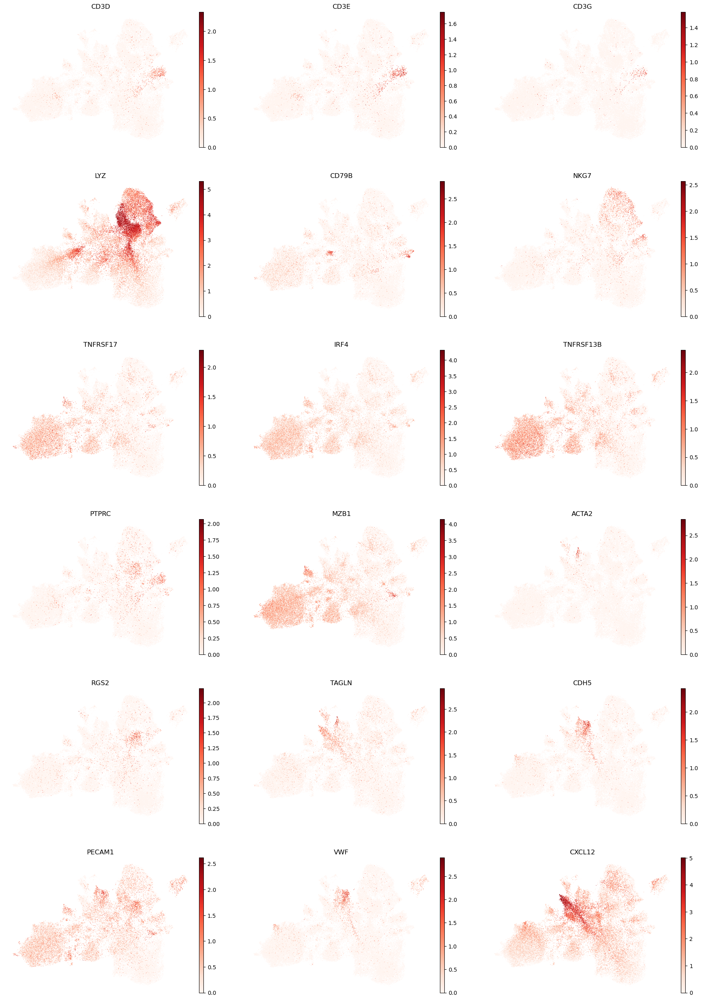

In [16]:
sc.pl.umap(
    adata,
    color=['CD3D','CD3E','CD3G','LYZ','CD79B','NKG7','TNFRSF17','IRF4','TNFRSF13B',
          'PTPRC','MZB1','ACTA2','RGS2','TAGLN','CDH5','PECAM1','VWF','CXCL12'],
    # Setting a smaller point size to get prevent overlap
    size=3,ncols=3,frameon=False,cmap='Reds'
)

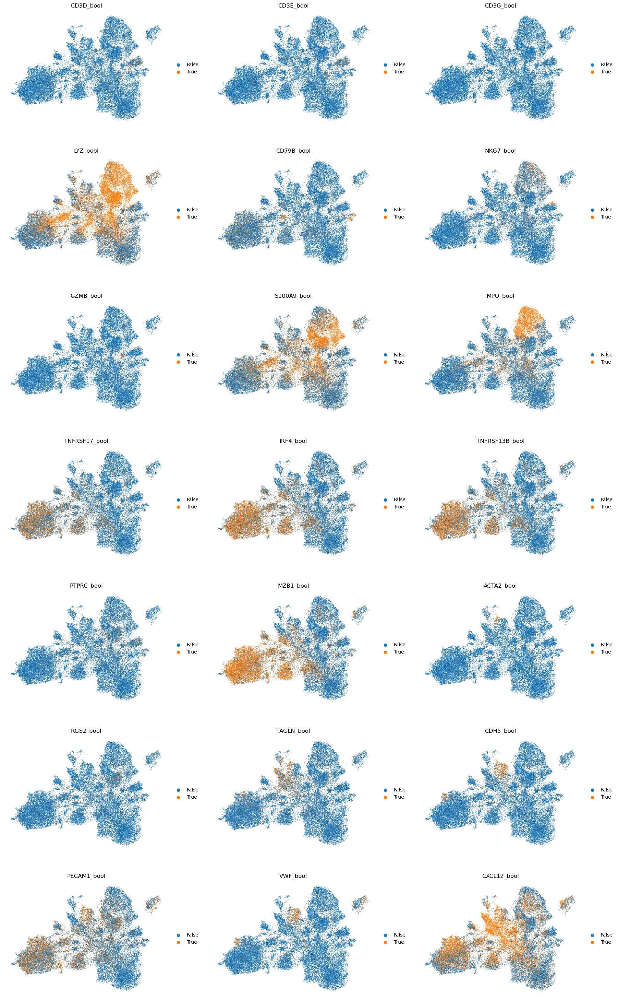

In [17]:
gs = ['CD3D','CD3E','CD3G','LYZ','CD79B','NKG7','GZMB','S100A9','MPO','TNFRSF17','IRF4','TNFRSF13B',
          'PTPRC','MZB1','ACTA2','RGS2','TAGLN','CDH5','PECAM1','VWF','CXCL12']

for g in gs:
    X=adata[:,g].X.sum(axis=1) 
    adata.obs[g+'_bool'] = np.array(np.array(X, dtype=bool), dtype=str)

sc.pl.umap(
    adata,
    color=[i+'_bool' for i in gs],size=3,ncols=3,frameon=False
)